<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [5]:
import time
import os

os.chdir(r"C:\Solutions")

import pandas as pd
import seaborn as sns

%pylab inline
plt.style.use('seaborn-darkgrid')
sns.set(font_scale=2)
warnings.filterwarnings(action="ignore");
np.random.seed(1234)

Populating the interactive namespace from numpy and matplotlib


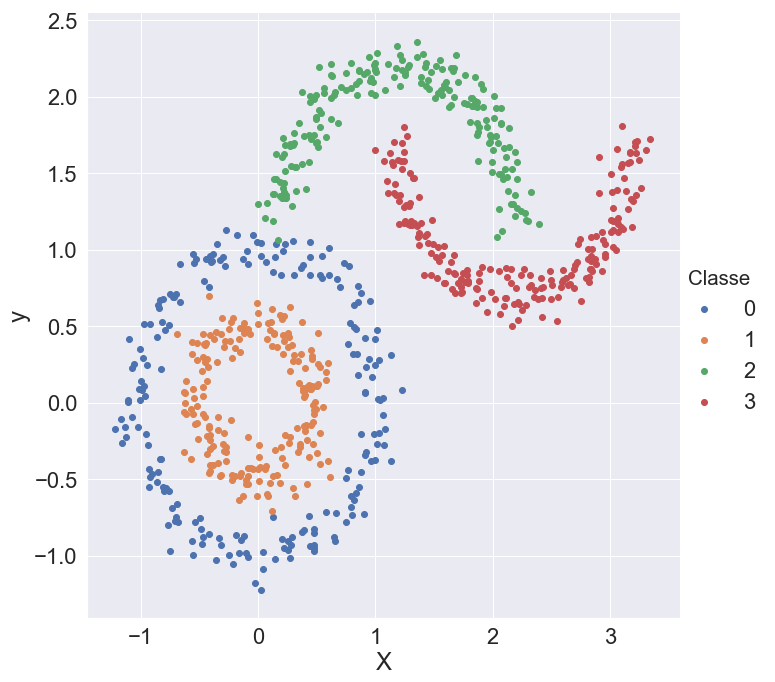

In [8]:
from sklearn.datasets.samples_generator import make_blobs

# #############################################################################
# Generate sample data
from sklearn.datasets import make_circles
from sklearn.datasets import make_moons
import pandas as pd
X, Y = make_circles(n_samples=400, factor=0.5, noise=.09)
X1, Y1 = make_moons(n_samples=400, noise=.09)
Y1 += 2
X1 += 1.2

X2 = np.concatenate((X, X1), axis=0)
Y2 = np.concatenate((Y, Y1), axis=0)
X, Y = X2,Y2

donnees = pd.DataFrame(X2,columns=['X','y'])
donnees['Classe'] = Y2
import seaborn as sns 
sns.FacetGrid(donnees, hue="Classe",  size = 10, aspect=1) \
   .map(plt.scatter, "X", "y") \
   .add_legend();

In [9]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(donnees.iloc[:,:3], 
                                                    donnees.Classe, 
                                                    stratify = donnees.Classe)

print(X_train.shape, y_train.shape, y_train.sum())
print(X_test.shape, y_test.shape, y_test.sum())

(600, 3) (600,) 900
(200, 3) (200,) 300


In [10]:
y_train.unique()

array([0, 1, 3, 2], dtype=int64)

In [11]:
from sklearn.ensemble import BaggingClassifier
model = BaggingClassifier(n_estimators=25,
                          bootstrap=True)
model.fit(X_train,y_train)

BaggingClassifier(base_estimator=None, bootstrap=True,
         bootstrap_features=False, max_features=1.0, max_samples=1.0,
         n_estimators=25, n_jobs=None, oob_score=False, random_state=None,
         verbose=0, warm_start=False)

In [12]:
def afficheEstimator(model,X,y):
    plt.figure(figsize=(24,16),dpi=150)

    n_classes = 4
    plot_colors = "yrbg"
    plot_step = 0.02

    #X, y = X_train,y_train
    # Train
    clf = model.fit(X, y)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout( pad=1.5, h_pad=0.5, w_pad=0.5)

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.where(y == i)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, cmap=plt.cm.RdYlBu, edgecolor='black', s=80)

    plt.axis("tight")
    plt.show()

In [13]:
X[:, 0].min() - .5, X[:, 0].max() + .5

(-1.7217977976171268, 3.8449312323377907)

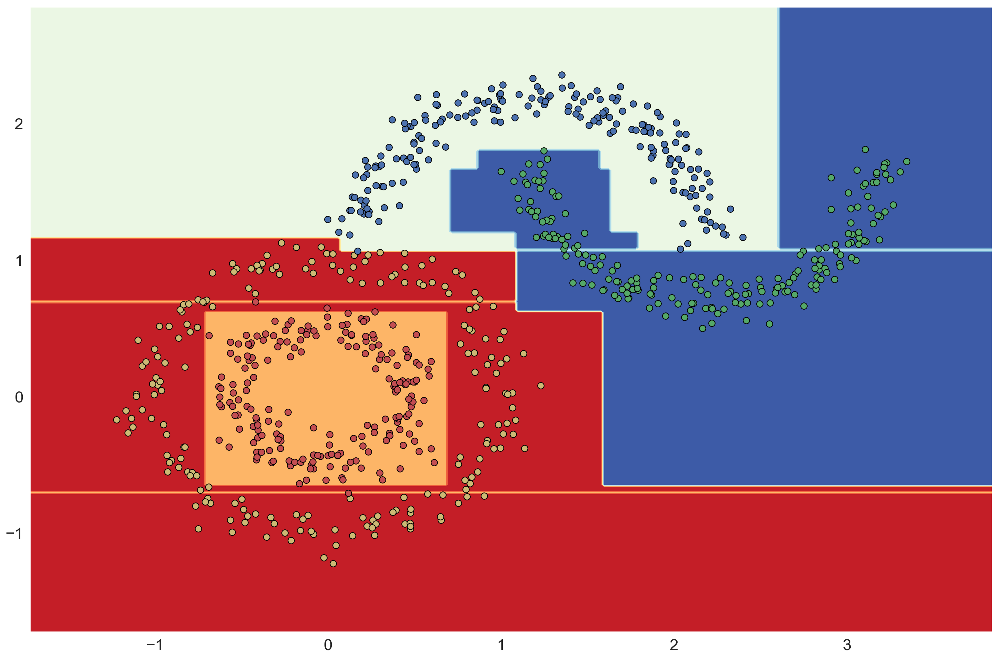

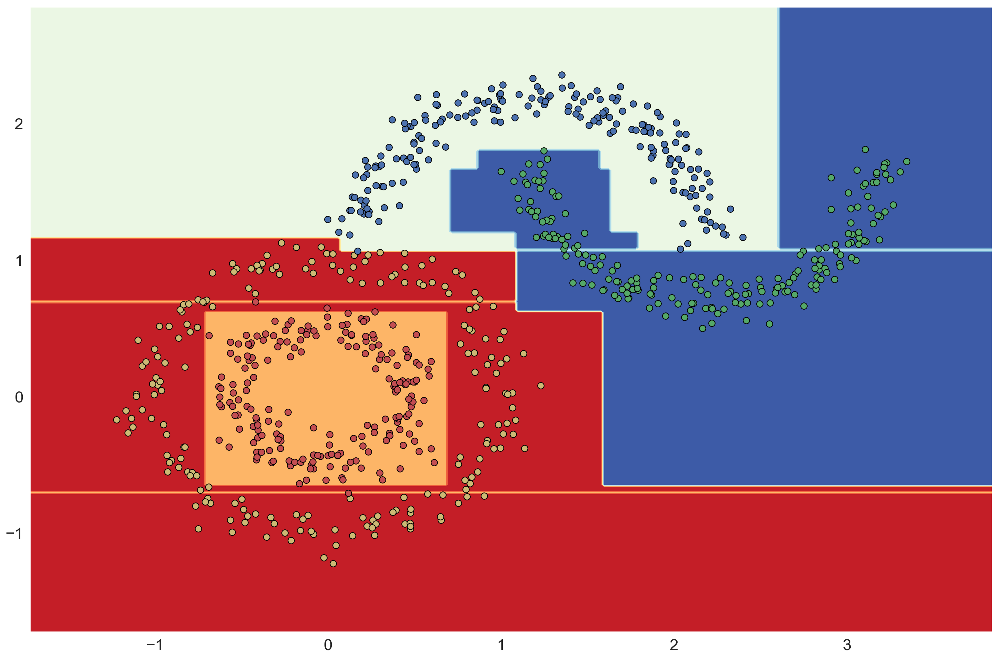

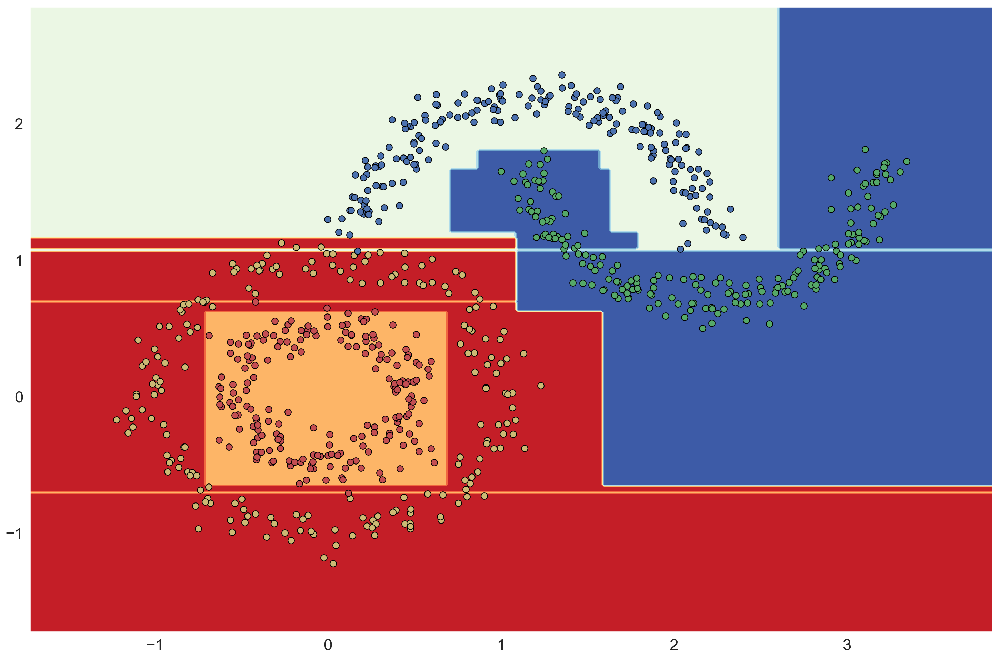

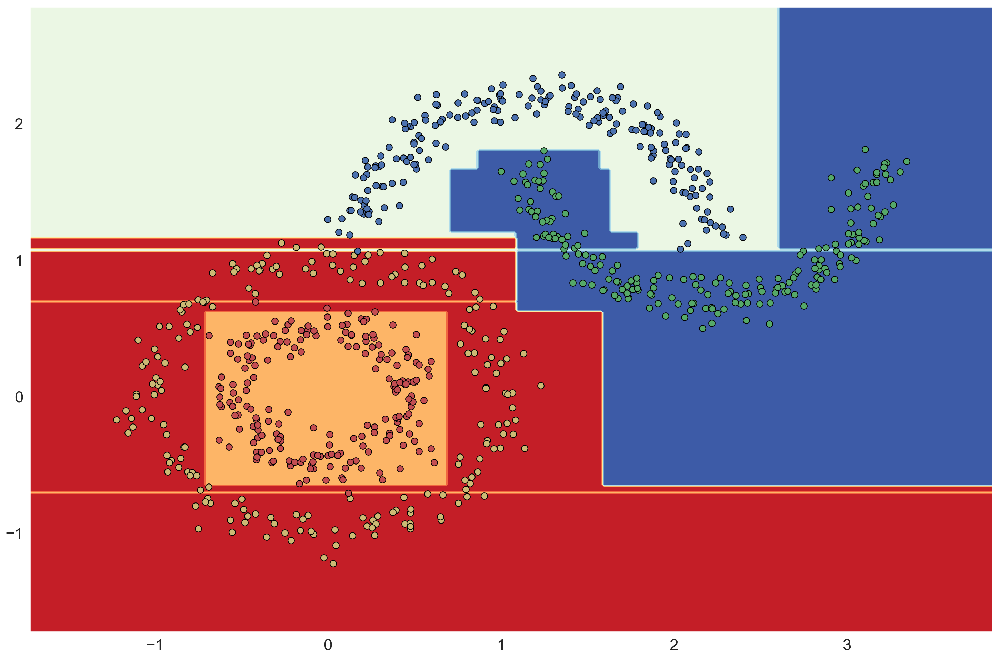

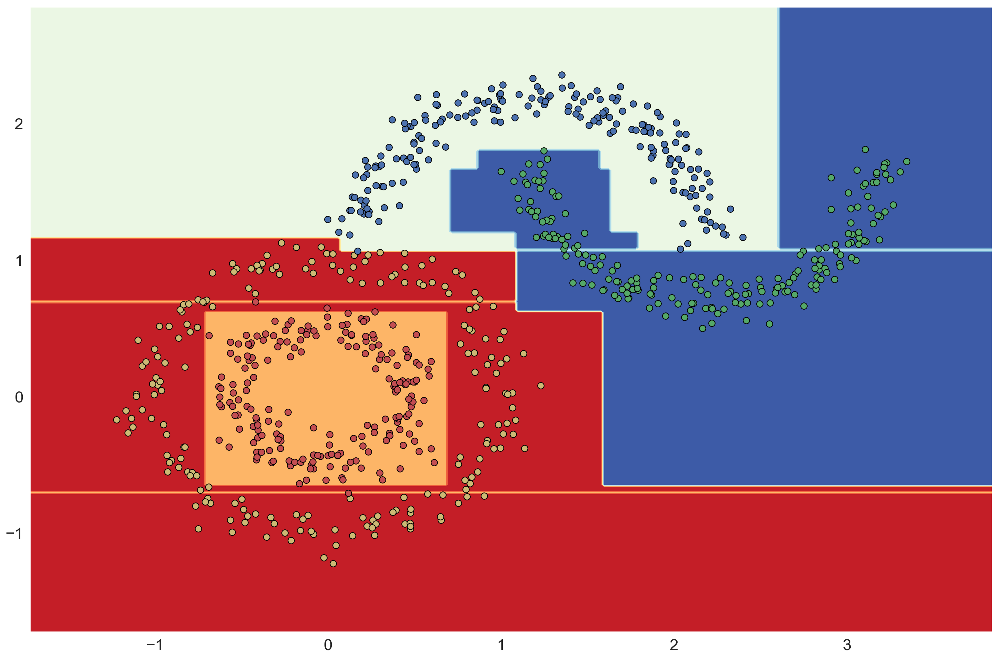

...

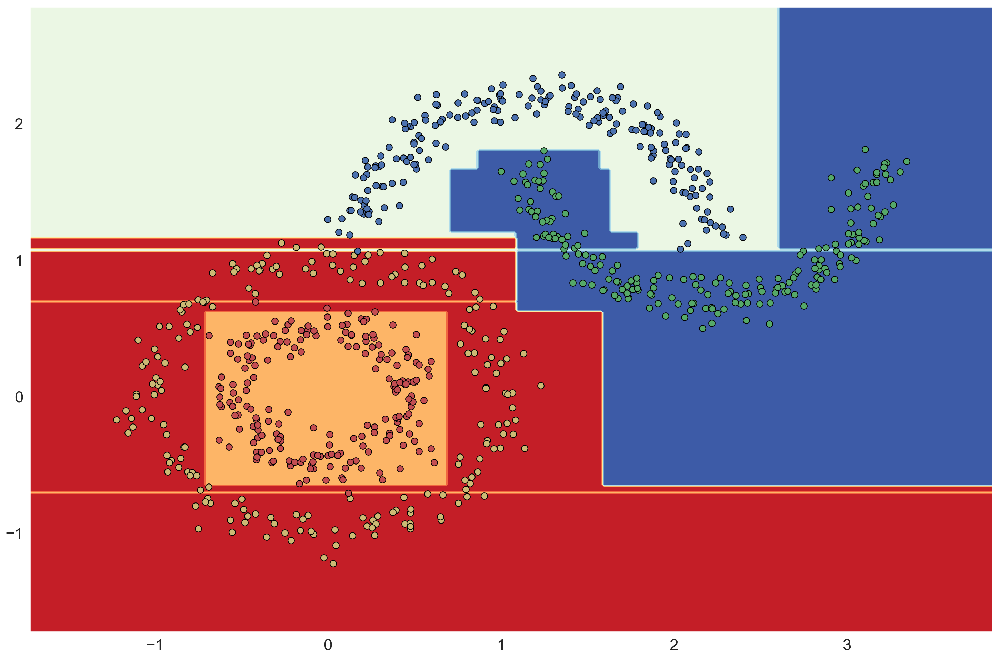

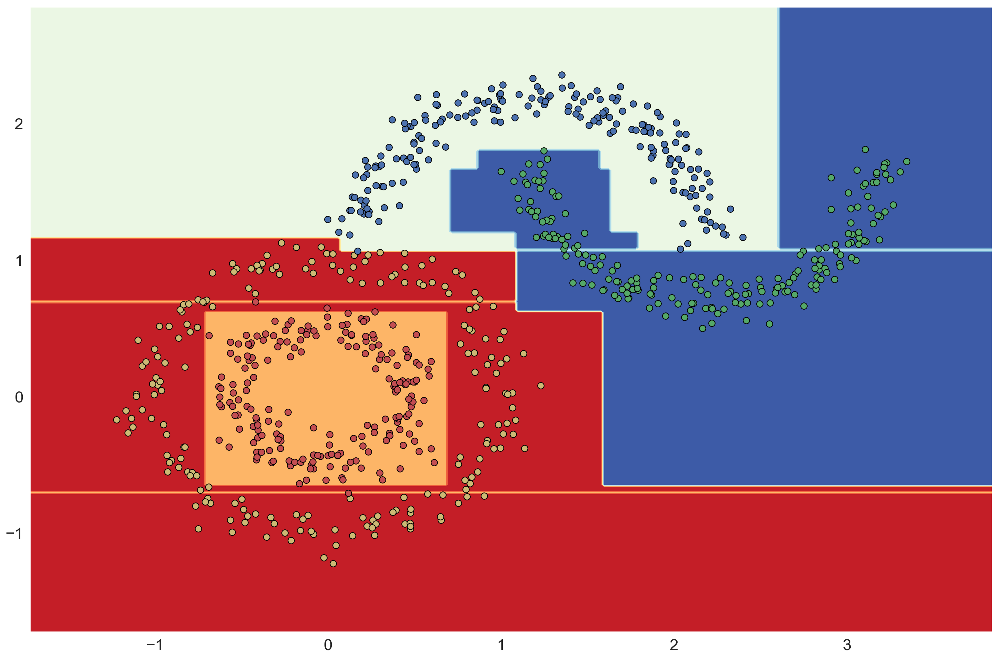

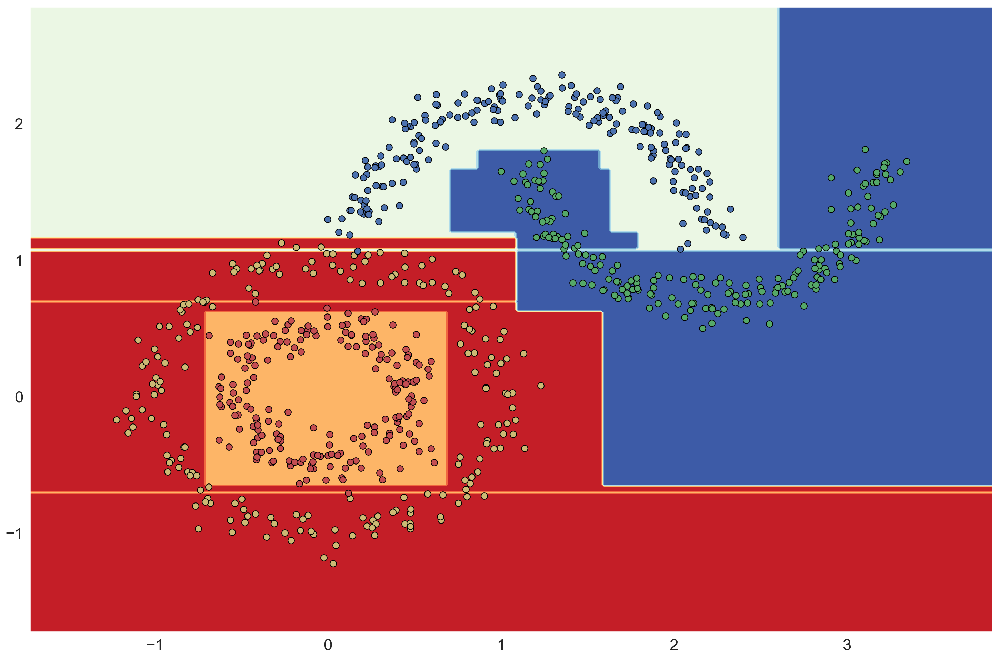

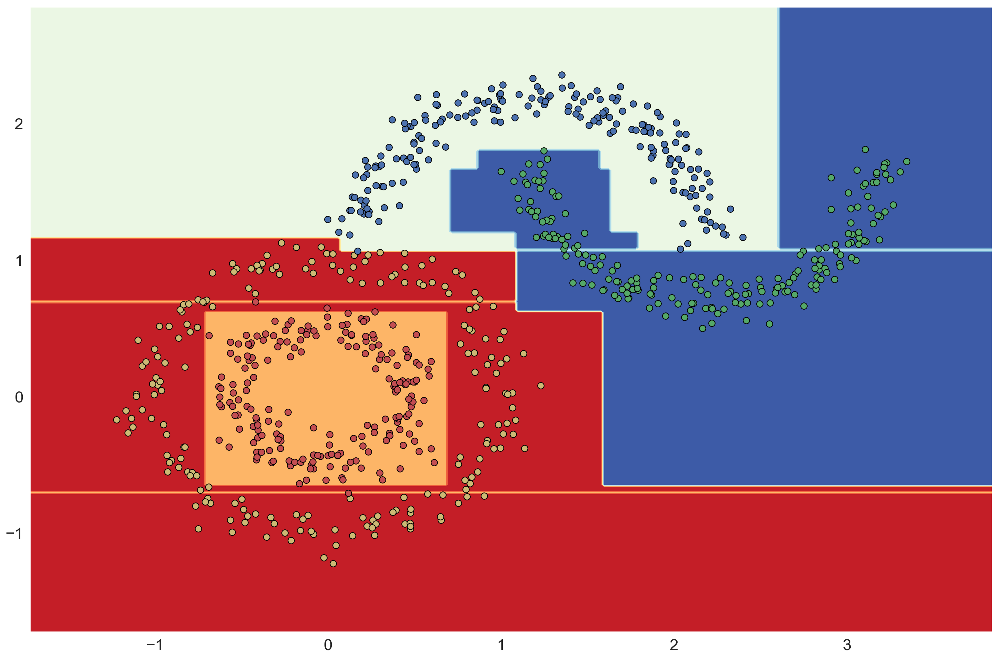

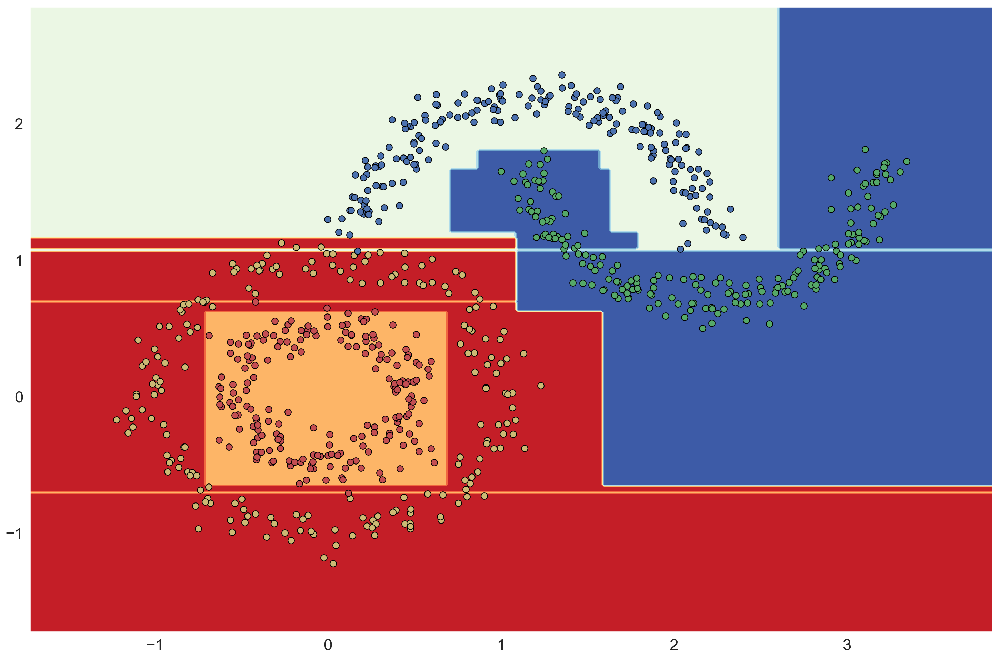

In [14]:
for m in model.estimators_ :
    afficheEstimator(m,X,Y)

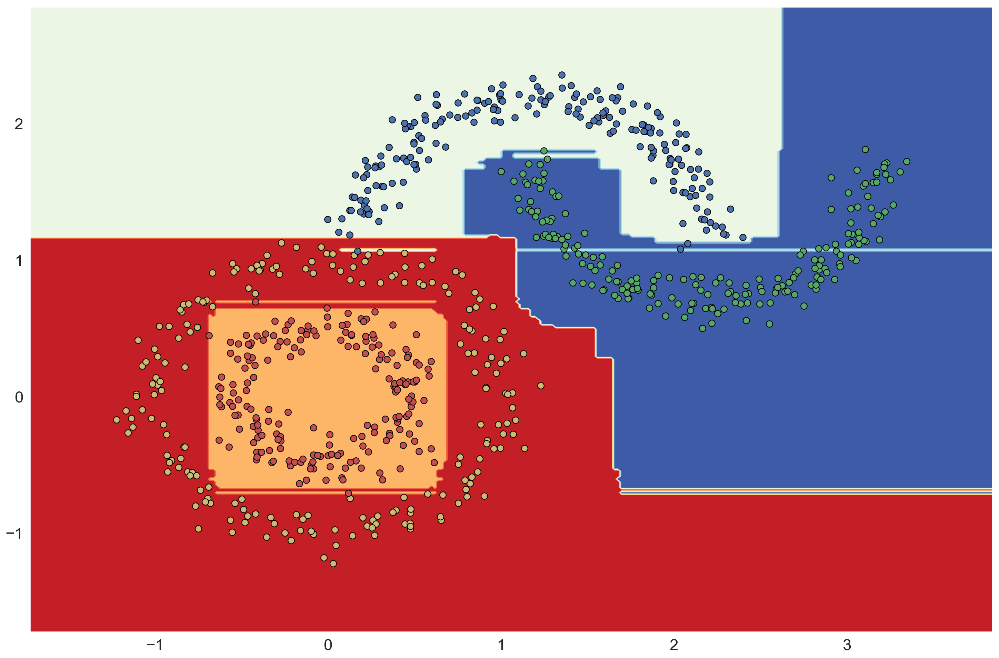

In [15]:
afficheEstimator(model,X,Y)